# A2-Q6: Pursuit Problem

In [1]:
import numpy as np

from scipy.integrate import solve_ivp
from scipy.interpolate import make_interp_spline

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

%matplotlib inline

In [2]:
def target(t):
    #
    # The target path is a helix
    #
    xT = np.sin(t)
    yT = np.cos(t)
    zT = t
    return [xT, yT, zT]
    
    

In [3]:
def rocket(t,P,SP,DMIN):
    #
    # This is the function that is called by the ODE solver.
    # It implements the differential equations defining
    # the trajectory of the pursuer.
    #
    # t: time
    # P: position of the pursuer
    # SP: Speed of the pursuer
    #
    # DMIN is not used here
    #   
    xP, yP, zP = P
    xT, yT, zT = target(t)
    dist = np.sqrt((xT-xP)**2 + (yT-yP)**2 + (zT-zP)**2)
    
    dx = SP * (xT - xP) / dist
    dy = SP * (yT - yP) / dist
    dz = SP * (zT - zP) / dist
    
    return [dx, dy, dz]   
    

In [4]:
def rocket_events(t,P,SP,DMIN):
    #
    # This is the event function.
    # When the rocket gets within DMIN of the target,
    # it records the time t at which this happens, and
    # terminates the ODE solver.
    #
    # t: time
    # P: position of pursuer
    # SP is not used here
    #
    xP, yP, zP = P
    xT, yT, zT = target(t)
    dist = np.sqrt((xT-xP)**2 + (yT-yP)**2 + (zT-zP)**2)
    return dist - DMIN

In [5]:
def animate(n,t,P):
    #
    # Plot the trajectory of the pursuer and target
    #
    # n: n-th frame of the animation
    # t[n]: time of n-th frame
    # P[n]: coordinates of the pursuer at time t[n]
    #
    T = target(t[n])
    Tx = [T[0]]; Ty = [T[1]]; Tz = [T[2]]
    Px = [P[n][0]]; Py = [P[n][1]]; Pz = [P[n][2]]
    
    ax.plot(Px, Py, Pz, 'go')
    ax.plot(Tx, Ty, Tz, 'bx')

RK23, 	 SP = 1.4, 	 Time Steps: 153, 	 Evaluations: 463, 	 Time intercept: No intercept
RK45, 	 SP = 1.4, 	 Time Steps: 36, 	 Evaluations: 223, 	 Time intercept: No intercept
RK23, 	 SP = 1.5, 	 Time Steps: 4871, 	 Evaluations: 14650, 	 Time intercept: 12.5478939141638
RK45, 	 SP = 1.5, 	 Time Steps: 2934, 	 Evaluations: 17713, 	 Time intercept: 12.540125262750303
RK23, 	 SP = 1.6, 	 Time Steps: 34772, 	 Evaluations: 104350, 	 Time intercept: 8.28070543808701
RK45, 	 SP = 1.6, 	 Time Steps: 16901, 	 Evaluations: 101569, 	 Time intercept: 8.278235585817686
RK23, 	 SP = 1.7, 	 Time Steps: 59364, 	 Evaluations: 178141, 	 Time intercept: 6.323006705708823
RK45, 	 SP = 1.7, 	 Time Steps: 26525, 	 Evaluations: 167197, 	 Time intercept: 6.321891719613921


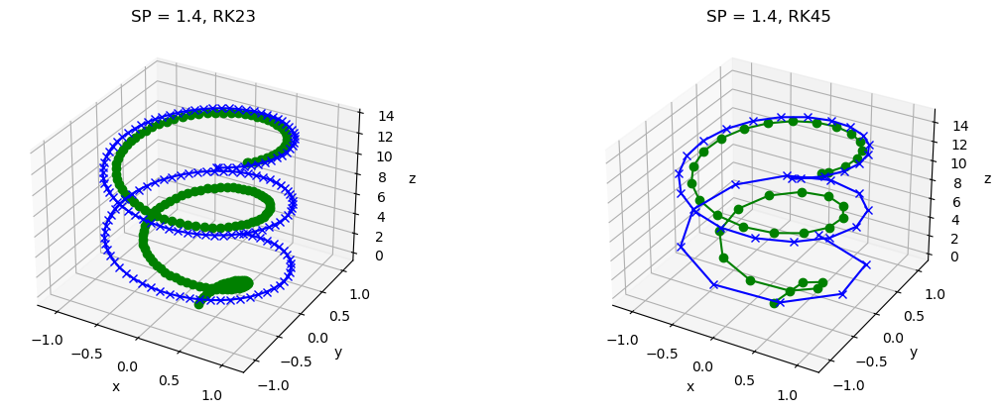

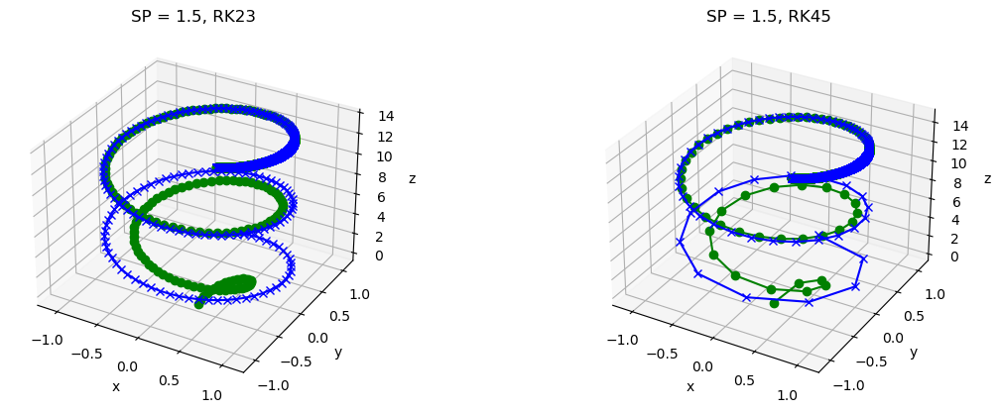

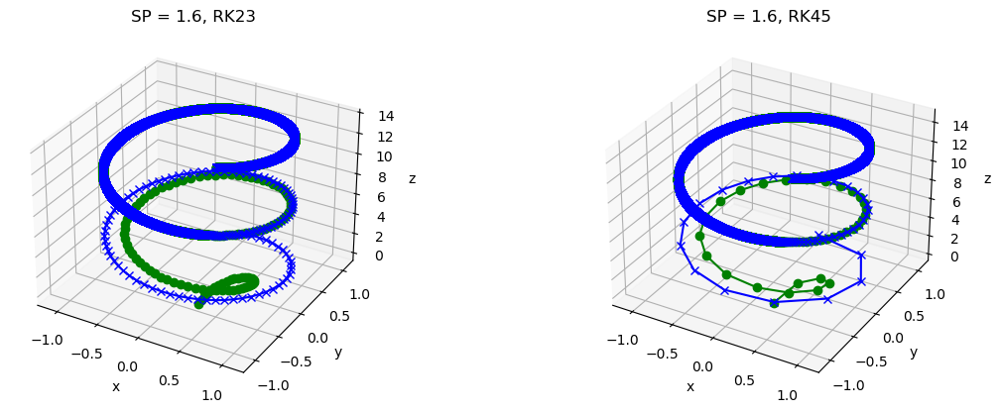

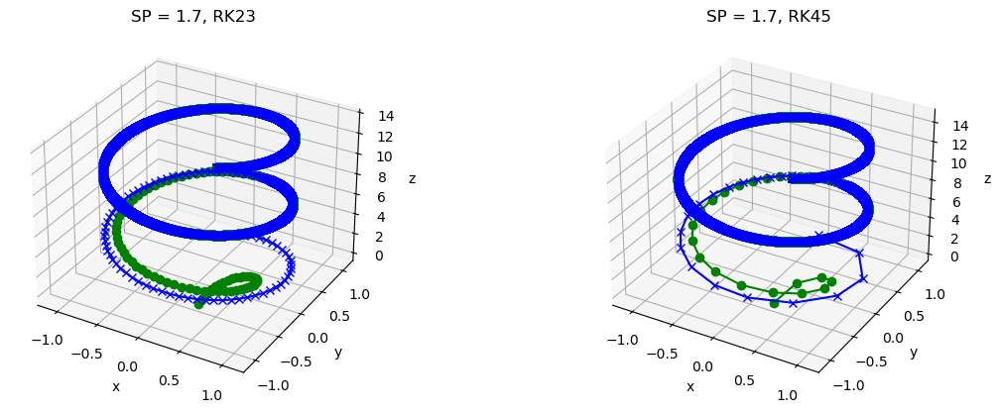

In [6]:
#
# Main program
#

#
# Set up parameter values for the pursuit problem
# t0, tfinal, etc
#
t_span = [0, 15]
P = [0, 0, -3]
DMIN = 0.1
#
# Set up parameter values for the ODE solver
# abs tol, rel tol, etc
#
# Solving ODEs
#
for SP in [1.4, 1.5, 1.6, 1.7]:
    #
    # Call ode solvers:
    sol1 = solve_ivp(rocket, t_span, P, method='RK23', events=rocket_events, args=(SP, DMIN), first_step = 1, max_step = 1, atol = 1e-5, rtol = 1e-5)
    sol2 = solve_ivp(rocket, t_span, P, method='RK45', events=rocket_events, args=(SP, DMIN), first_step = 1, max_step = 1, atol = 1e-5, rtol = 1e-5)

    #
    # Display numerical results
    # number of time steps, number of evaluations, time of intercept
    #
    if sol1.t_events[0].size != 0:
        toi_RK23 = sol1.t_events[0][0]
    else:
        toi_RK23 = "No intercept"
        
    print(f"RK23, \t SP = {SP}, \t Time Steps: {len(sol1.t)}, \t Evaluations: {sol1.nfev}, \t Time intercept: {toi_RK23}")
    
    if sol1.t_events[0].size != 0:
        toi_RK45 = sol2.t_events[0][0]
    else:
        toi_RK45 = "No intercept"
    print(f"RK45, \t SP = {SP}, \t Time Steps: {len(sol2.t)}, \t Evaluations: {sol2.nfev}, \t Time intercept: {toi_RK45}")
    
    #
    # Display trajectories of 
    # Green: pursuer
    # Blue: target
    #
    fig = plt.figure(figsize=plt.figaspect(0.35))
    ax1 = fig.add_subplot(1,2,1, projection='3d')
    ax1.set_xlim3d(-1.2,1.2)
    ax1.set_ylim3d(-1.2,1.2)
    ax1.set_zlim3d(-0.5,14)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('z')
    ax1.set_title('SP = %.1f, RK23' %(SP))
    P1x, P1y, P1z = sol1.y
    ax1.plot3D(P1x, P1y, P1z, 'go-')
    Tx, Ty, Tz = target(sol1.t)
    ax1.plot3D(Tx, Ty, Tz, 'bx-')   
    
    ax2 = fig.add_subplot(1,2,2, projection='3d')
    ax2.set_xlim3d(-1.2,1.2)
    ax2.set_ylim3d(-1.2,1.2)
    ax2.set_zlim3d(-0.4,15)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    ax2.set_title('SP = %.1f, RK45' %(SP))
    P2x, P2y, P2z = sol2.y
    ax2.plot3D(P2x, P2y, P2z, 'go-')
    Tx, Ty, Tz = target(sol2.t)
    ax2.plot3D(Tx, Ty, Tz, 'bx-')   

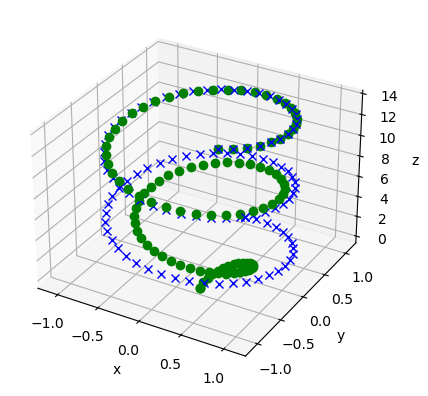

In [9]:
# (This one is just for fun)
#
# Animation of trajectories
# Green: pursuer
# Blue: target
#
fig = plt.figure()

ax = plt.axes(projection='3d')
ax.set_xlim3d(-1.2,1.2)
ax.set_ylim3d(-1.2,1.2)
ax.set_zlim3d(-0.4,14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#
# Solve the ODE for SP=1.5
#
SP = 1.5
sol = solve_ivp(rocket, t_span, P, method='RK45', events=rocket_events, args=(SP, DMIN), first_step = 1, max_step = 1, atol = 1e-5, rtol = 1e-5)

t = sol.t
P = sol.y.T
n = np.size(t)

m = 100
cs = make_interp_spline(t,P)
tt = np.linspace(t[0],t[n-1],m)
PP = cs(tt)

# Create animation
anim = animation.FuncAnimation(fig, animate, frames = m, fargs = (tt, PP,), interval=100)
HTML(anim.to_jshtml())

On average the RK45 ODE solver is more efficient in terms of steps and evaluations as it takes almost 1/2 the number of steps as RK23. There was one instance where the number of evaluations in RK45 exceeded that of RK23 which was at speed 1.5. However, the general trend points towards RK45 being more efficient in terms of steps and evalutions based on our observed set of solutions.